In [158]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [159]:
#importation dataset  

df = pd.read_csv('/home/utilisateur/Documents/dev_ia/US_SBA/loan_project/SBAnational.csv')

df.head(3)

/tmp/ipykernel_5044/2771360947.py:3: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/home/utilisateur/Documents/dev_ia/US_SBA/loan_project/SBAnational.csv')


,LoanNr_ChkDgt,Name,City,State,Zip,Bank,BankState,NAICS,ApprovalDate,ApprovalFY,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural,RevLineCr,LowDoc,ChgOffDate,DisbursementDate,DisbursementGross,BalanceGross,MIS_Status,ChgOffPrinGr,GrAppv,SBA_Appv
0,1000014003,ABC HOBBYCRAFT,EVANSVILLE,IN,47711,FIFTH THIRD BANK,OH,451120,28-Feb-97,1997,84,4,2.0,0,0,1,0,N,Y,NaN,28-Feb-99,"$60,000.00",$0.00,P I F,$0.00,"$60,000.00","$48,000.00"
1,1000024006,LANDMARK BAR & GRILLE (THE),NEW PARIS,IN,46526,1ST SOURCE BANK,IN,722410,28-Feb-97,1997,60,2,2.0,0,0,1,0,N,Y,NaN,31-May-97,"$40,000.00",$0.00,P I F,$0.00,"$40,000.00","$32,000.00"
2,1000034009,"WHITLOCK DDS, TODD M.",BLOOMINGTON,IN,47401,GRANT COUNTY STATE BANK,IN,621210,28-Feb-97,1997,180,7,1.0,0,0,1,0,N,N,NaN,31-Dec-97,"$287,000.00",$0.00,P I F,$0.00,"$287,000.00","$215,250.00"


In [160]:
# dimension du dataset

df.shape

(899164, 27)

In [161]:
# noms des colonnes 
df.columns

Index(['LoanNr_ChkDgt', 'Name', 'City', 'State', 'Zip', 'Bank', 'BankState',
       'NAICS', 'ApprovalDate', 'ApprovalFY', 'Term', 'NoEmp', 'NewExist',
       'CreateJob', 'RetainedJob', 'FranchiseCode', 'UrbanRural', 'RevLineCr',
       'LowDoc', 'ChgOffDate', 'DisbursementDate', 'DisbursementGross',
       'BalanceGross', 'MIS_Status', 'ChgOffPrinGr', 'GrAppv', 'SBA_Appv'],
      dtype='object')

In [162]:
# types des variables 

df.dtypes

LoanNr_ChkDgt          int64
Name                  object
City                  object
State                 object
Zip                    int64
Bank                  object
BankState             object
NAICS                  int64
ApprovalDate          object
ApprovalFY            object
Term                   int64
NoEmp                  int64
NewExist             float64
CreateJob              int64
RetainedJob            int64
FranchiseCode          int64
UrbanRural             int64
RevLineCr             object
LowDoc                object
ChgOffDate            object
DisbursementDate      object
DisbursementGross     object
BalanceGross          object
MIS_Status            object
ChgOffPrinGr          object
GrAppv                object
SBA_Appv              object
dtype: object

In [163]:
# nombre de valeurs unique 
df.nunique()

LoanNr_ChkDgt        899164
Name                 779583
City                  32581
State                    51
Zip                   33611
Bank                   5802
BankState                56
NAICS                  1312
ApprovalDate           9859
ApprovalFY               70
Term                    412
NoEmp                   599
NewExist                  3
CreateJob               246
RetainedJob             358
FranchiseCode          2768
UrbanRural                3
RevLineCr                18
LowDoc                    8
ChgOffDate             6448
DisbursementDate       8472
DisbursementGross    118859
BalanceGross             15
MIS_Status                2
ChgOffPrinGr          83165
GrAppv                22128
SBA_Appv              38326
dtype: int64

In [164]:
# doublons
df.duplicated().sum()

0

In [165]:
# valeurs manquantes 
df.isna().sum()

LoanNr_ChkDgt             0
Name                     14
City                     30
State                    14
Zip                       0
Bank                   1559
BankState              1566
NAICS                     0
ApprovalDate              0
ApprovalFY                0
Term                      0
NoEmp                     0
NewExist                136
CreateJob                 0
RetainedJob               0
FranchiseCode             0
UrbanRural                0
RevLineCr              4528
LowDoc                 2582
ChgOffDate           736465
DisbursementDate       2368
DisbursementGross         0
BalanceGross              0
MIS_Status             1997
ChgOffPrinGr              0
GrAppv                    0
SBA_Appv                  0
dtype: int64

In [166]:
# describe stat 

df.describe()

,LoanNr_ChkDgt,Zip,NAICS,Term,NoEmp,NewExist,CreateJob,RetainedJob,FranchiseCode,UrbanRural
count,8.991640e+05,899164.000000,899164.000000,899164.000000,899164.000000,899028.000000,899164.000000,899164.000000,899164.000000,899164.000000
mean,4.772612e+09,53804.391241,398660.950146,110.773078,11.411353,1.280404,8.430376,10.797257,2753.725933,0.757748
std,2.538175e+09,31184.159152,263318.312760,78.857305,74.108196,0.451750,236.688165,237.120600,12758.019136,0.646436
min,1.000014e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.589758e+09,27587.000000,235210.000000,60.000000,2.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,4.361439e+09,55410.000000,445310.000000,84.000000,4.000000,1.000000,0.000000,1.000000,1.000000,1.000000
75%,6.904627e+09,83704.000000,561730.000000,120.000000,10.000000,2.000000,1.000000,4.000000,1.000000,1.000000
max,9.996003e+09,99999.000000,928120.000000,569.000000,9999.000000,2.000000,8800.000000,9500.000000,99999.000000,2.000000


# description du jeu de données

NAICS : Code du système de classification des industries nord-américaines

City : ville entreprise

State : entrepris

Zip : entreprise

Bank : nom

BankState

ApprovalDate : Date précise (jr mois année) à laquelle le prêt a été officiellement approuvé
Suivre le pipeline d'approbation et analyser les délais de traitement, identifier les tendances d'approbation selon la période de l'année


ApprovalFY : Année (exercice fiscal) durant laquelle le prêt à été approuvé 
Suivre les tendances d'approbation sur plusieurs années, comparer les volumes d'approbation

Term : Durée du prêt en mois


NoEmp : Nombre d'employés de l'entreprise


NewExist : 1 = Entreprise existante, 2 = Nouvelle entreprise


CreateJob : Nombre d'emplois créés grace au crédit 


RetainedJob : Nombre d'emplois conservés grace au crédit 


FranchiseCode : Franchise code, (00000 or 00001) = No franchise 


UrbanRural : 1 = Urban, 2 = rural, 0 = undefined


LowDoc : processus de demande simplifié et une documentation réduite. 
programme spécifique proposé par la SBA permettant aux petites entreprises d'emprunter jusqu'à 150 000 $ avec moins de paperasserie.
O = Oui, N = Non 


ChgOffDate : La date à laquelle un prêt est déclaré en défaut


DisbursementDate :Date de versement à l’entreprise


DisbursementGross  : Montant total versé à l’emprunteur

BalanceGross :Il s'agit du montant total d'argent que l'emprunteur doit encore à la SBA, y compris le principal restant, les intérêts courus et les frais impayés.

MIS_Status : Statut du prêt débité = CHGOFF, Payé en totalité = PIF


ChgOffPrinGr : c’est le montant du prêt que la SBA a déterminé ne serait probablement pas remboursé.

SBA_Appv : Montant garanti du prêt approuvé par la SBA



GrAppv : montant total du prêt qui a été approuvé par la SBA


RevLineCr :  crédit revolving









































In [167]:
#  traitement des données manquantes 

df = df.dropna()

In [168]:
#  affiche le nombre de crédit remboursé ou pas:

df['MIS_Status'].value_counts()

MIS_Status
CHGOFF    155994
P I F       4877
Name: count, dtype: int64

In [169]:
# nettoyage  et conversion
index_a_modifier = df[df['ApprovalFY'] == '1976A'].index
nouvelle_valeur = "1976"
df.loc[index_a_modifier, 'ApprovalFY'] = nouvelle_valeur

df['ApprovalFY'] = df['ApprovalFY'].astype(str)

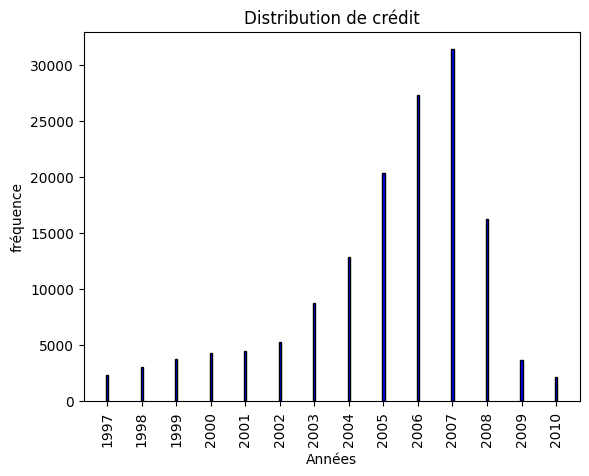

In [170]:
# distribution crédits par an 


value_counts = df['ApprovalFY'].value_counts()

largeur_barres = 0.5


value_counts_filtre = value_counts[value_counts.values >= 1990]
value_counts_filtre = value_counts_filtre.sort_index()

positions_barres = [8 * i for i in range(len(value_counts_filtre))]
plt.bar(positions_barres, value_counts_filtre.values, color='blue', edgecolor = 'black', width= largeur_barres)

# Définition des étiquettes d'axe x avec les années correspondantes et un espacement approprié
positions_barres_labels = [i for i in range(0, len(value_counts_filtre) * 8, 8)]
plt.xticks(positions_barres_labels, value_counts_filtre.index, rotation='vertical')


plt.xlabel('Années')
plt.ylabel('fréquence')
plt.title('Distribution de crédit')
# Augmente la visibilité des barres

plt.show()

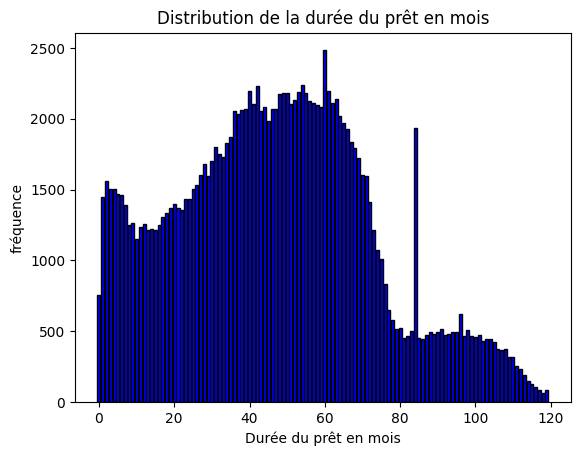

count    160871.000000
mean         56.626900
std          46.341801
min           0.000000
25%          29.000000
50%          49.000000
75%          68.000000
max         461.000000
Name: Term, dtype: float64

In [194]:
# durée prêt mois 
value_counts2 = df['Term'].value_counts()

value_counts2_filtre = value_counts2[value_counts2.index < 120]
value_counts2_filtre = value_counts2_filtre.sort_index()

plt.bar(value_counts2_filtre.index, value_counts2_filtre.values, color='blue', edgecolor = 'black')


plt.xlabel('Durée du prêt en mois')
plt.ylabel('fréquence')
plt.title('Distribution de la durée du prêt en mois')
# Augmente la visibilité des barres

plt.show()
df['Term'].describe()


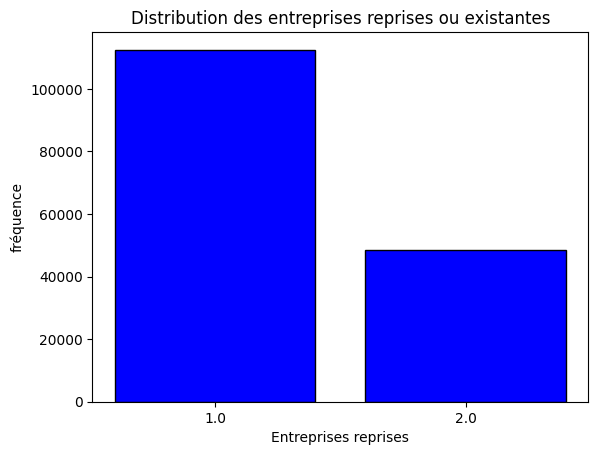

array([2., 1.])

In [215]:
value_counts3 = df['NewExist'].value_counts()

value_counts3_filtre = value_counts3[value_counts3.index.isin([1,2])]
positions_barres = [1,2]

plt.bar(positions_barres, value_counts3_filtre.values , color='blue', edgecolor = 'black')

# Définition des étiquettes d'axe x pour les valeurs 1 et 2
plt.xticks(positions_barres, value_counts3_filtre.index)

plt.xlabel("Entreprises reprises")
plt.ylabel('fréquence')
plt.title("Distribution des entreprises reprises ou existantes")
# Augmente la visibilité des barres

plt.show()


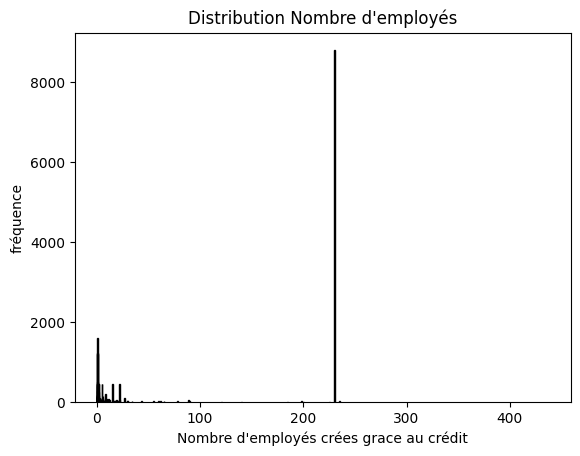

CreateJob
0       100650
1        19372
2        15869
3         6851
4         4260
         ...  
458          1
409          1
1618         1
57           1
73           1
Name: count, Length: 125, dtype: int64


In [254]:
# Nombre d'employés crée ds l'entreprise

value_counts3 = df['CreateJob'].value_counts()

value_counts3_filtre = value_counts3[value_counts3.values < 500]

value_counts3_filtre.sort_index()




plt.bar(value_counts3_filtre.values, value_counts3_filtre.index , color='blue', edgecolor = 'black')


plt.xlabel("Nombre d'employés crées grace au crédit")
plt.ylabel('fréquence')
plt.title("Distribution Nombre d'employés")
# Augmente la visibilité des barres

plt.show()
df['CreateJob'].describe()

print(df['CreateJob'].value_counts())

Bank
BANK OF AMERICA NATL ASSOC        24761
BBCN BANK                         13633
JPMORGAN CHASE BANK NATL ASSOC    13411
CAPITAL ONE NATL ASSOC             9477
WELLS FARGO BANK NATL ASSOC        9126
                                  ...  
FIRST CHEROKEE STATE BANK             1
TRADERS BANK                          1
ANDES STATE BANK                      1
COLLINSVILLE SAVINGS SOCIETY          1
DEPCO                                 1
Name: count, Length: 3476, dtype: int64


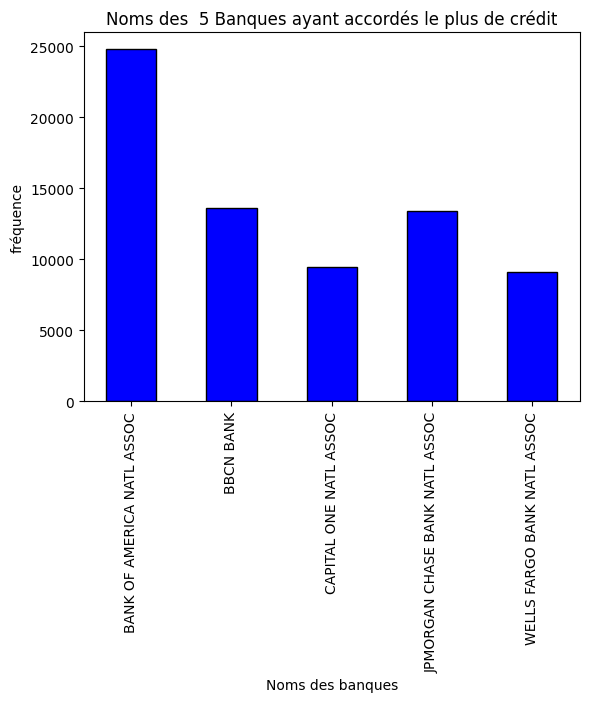

In [263]:
value_counts = df['Bank'].value_counts()

print(value_counts)

largeur_barres = 0.5


value_counts_filtre = value_counts[value_counts.values > 9000]
value_counts_filtre = value_counts_filtre.sort_index()

# positions_barres = [8 * i for i in range(len(value_counts_filtre))]
plt.bar(value_counts_filtre.index, value_counts_filtre.values, color='blue', edgecolor = 'black', width= largeur_barres)

# # # Définition des étiquettes d'axe x avec les années correspondantes et un espacement approprié
# positions_barres_labels = [i for i in range(0, len(value_counts_filtre) * 8, 8)]
# plt.xticks(positions_barres_labels, value_counts_filtre.index, rotation='vertical')
plt.xticks(rotation='vertical')

plt.xlabel('Noms des banques')
plt.ylabel('fréquence')
plt.title('Noms des  5 Banques ayant accordés le plus de crédit')
# Augmente la visibilité des barres

plt.show()

In [171]:
cat_cols = df.select_dtypes(include="object")
for cat in cat_cols:
    print(cat)
    display(df[cat].unique())
    print()

Name


array(['MIDDLE ATLANTIC SPORTS CO INC', 'PAUL E. & JUDY A. FAATZ',
       'LARRY SCHOETTMER FORD INC', 'NEW DIMENSION HOMES INC',
       'Mykols Marine Inc.', 'Grass Valley Market', 'LILY DAY GARDENS',
       'URBAN BEAST-SEATTLE LLC', 'SHAFI SECURITY', 'The Cheese Box',
       'DAYS INN OF SOUTH BEND, L.P.', 'CHESAPEAKE BAGEL BAKERY',
       'Eggs By Byrd', 'FISCHER MERLIN INDUSTRIS INC',
       'STEUART MULTI-MEDIA', 'GOLDMAN WEBBER & ASSOCIATES IN',
       'URBAN BEAST SEATTLE LLC', 'DREAM DESIGN HAIRSTYLING',
       '505 MENDOCINO AVENUE', 'MILL PRINTING & LITHO CORP',
       "ANGELO'S TOWING INC", 'ABSA TRANSPORTATION',
       'United Expansion, Inc.', 'Milton Wood Products',
       'MARBLELIFE OF NE NEW JERSEY, I', 'NSG CORP', 'AGN COMPANY, LLC.',
       'POWDER TECH SOLUTIONS INC', 'Mountain Oil',
       'WOODVIEW FAMILY CARE PLC', 'DIMENSIONS', 'Rockland Garage Door',
       'INFINITE SOLUTIONS GROUP', 'AFFILIATED PROPERTY SERVICES L',
       'FAIRNMAR ORIGINAL WHOPPA INC', 'JK


City


array(['UNION', 'KINSMAN', 'EDINBURGH', 'CLINTON (CENSUS NAME FOR CLINT',
       'Spring Lake', 'Grass Valley', 'BURNET', 'SEATTLE', 'THORNTON',
       'Moses Lake', 'SOUTH BEND', 'HUNTINGTON', 'Wappapello', 'BOHEMIA',
       'JESUP', 'RENO', 'BELLEVIEW', 'SANTA ROSA', 'WHITE PLAINS  *102',
       'SAN DIEGO', 'TOLLESON', 'Newburgh', 'Milton', 'LINCOLN PARK',
       'BATTLE MOUNTAIN', 'ROCK HILL', 'ORLANDO', 'North Branch',
       'MUSKEGON', 'OCEAN CITY', 'Rockland', 'RIDGELAND',
       'PLEASANT GROVE', 'LYNBROOK', 'ST. JOHN', 'Fairport', 'CARBONDALE',
       'HOUSTON', 'Caribou', 'Colville', 'ROCHESTER', 'SPRINGFIELD',
       'CHICAGO', 'HOLBROOK', 'BLOOMINGDALE', 'Amenia', 'BELLINGHAM',
       'Hamburg', 'SAINT LOUIS', 'Cumberland Center', 'Waterville',
       'NEPTUNE BEACH', 'LAKEWOOD CENTER (CENSUS NAME L',
       'HUNTINGTON PARK', 'RINGGOLD', 'WACO', 'LOS ANGELES',
       'WARNER ROBINS', 'Wappingers Falls', 'SAN MARCOS', 'ROCKLIN',
       'SAN JOSE', 'AURORA', 'TUCSON', 'ESCO


State


array(['NJ', 'OH', 'IN', 'ME', 'MI', 'OR', 'TX', 'WA', 'CO', 'WV', 'MO',
       'NY', 'IA', 'NV', 'FL', 'CA', 'AZ', 'VT', 'SC', 'MD', 'MS', 'UT',
       'ND', 'IL', 'GA', 'NM', 'MA', 'MN', 'CT', 'VA', 'NH', 'NC', 'RI',
       'OK', 'ID', 'PA', 'AL', 'AK', 'TN', 'WI', 'DC', 'KS', 'HI', 'LA',
       'AR', 'SD', 'NE', 'KY', 'MT', 'DE', 'WY'], dtype=object)


Bank


array(['WELLS FARGO BANK NATL ASSOC', 'CORTLAND SAVINGS & BK. CO.',
       'JPMORGAN CHASE BANK NATL ASSOC', 'U.S. BANK NATIONAL ASSOCIATION',
       'READYCAP LENDING, LLC', 'THE HUNTINGTON NATIONAL BANK',
       'FARMERS STATE BANK', 'REGIONS BANK', 'SAFE-BIDCO',
       'HSBC BK USA NATL ASSOC', 'FIRST NATL BK OF SOUTHERN CALI',
       'KEYBANK NATIONAL ASSOCIATION', 'FIRST BANK',
       'BANCO POPULAR NORTH AMERICA', 'COMMUNITY SHORES BANK',
       'PNC BANK, NATIONAL ASSOCIATION', 'BBCN BANK',
       'CITIZENS COMMUNITY CU', 'LIBERTY BANK', 'NORTH COMMUNITY BANK',
       'MB FINAN BANK NATL ASSOC', 'HERITAGE BANK', 'COLONY BANK',
       'FIRST-CITIZENS BK & TR CO', 'CITYWIDE BANKS',
       'CALIFORNIA BANK & TRUST', 'LEA COUNTY STATE BANK',
       'FIRST BANK & TRUST COMPANY', 'BANK OF AMERICA NATL ASSOC',
       'WHITNEY BANK', 'COMM. SERVICES OF PERRY INC',
       'LOANS FROM UNIDENTIFIED LENDER', 'COMERICA BANK', 'UMPQUA BANK',
       'BREMER BANK NATL ASSOC', 'SOUTHWEST SECURIT


BankState


array(['SD', 'OH', 'IN', 'IL', 'CA', 'WV', 'NY', 'IA', 'AL', 'MO', 'MI',
       'DE', 'ND', 'WA', 'GA', 'NC', 'CO', 'NM', 'TX', 'OR', 'MS', 'DC',
       'MN', 'UT', 'CT', 'RI', 'SC', 'ID', 'NV', 'MD', 'WI', 'NJ', 'PA',
       'AR', 'KS', 'HI', 'TN', 'FL', 'MA', 'VA', 'PR', 'NE', 'OK', 'KY',
       'NH', 'AZ', 'VT', 'MT', 'LA', 'ME', 'AK', 'WY', 'EN'], dtype=object)


ApprovalDate


array(['2-Jun-80', '28-Feb-97', '11-Jun-80', '7-Feb-06', '31-Mar-97',
       '21-Apr-97', '3-Mar-97', '2-May-97', '18-Jun-80', '19-Jun-80',
       '17-Apr-98', '8-May-98', '12-Jun-98', '29-Jun-98', '26-Aug-98',
       '4-Nov-98', '16-Nov-98', '1-Jul-80', '25-Jun-80', '19-May-99',
       '30-Jun-80', '30-Aug-99', '23-Nov-99', '1-Jan-00', '4-Jan-00',
       '5-Jul-00', '6-Apr-01', '30-Apr-01', '22-Jun-01', '25-Jun-01',
       '28-Jun-01', '29-Jun-01', '13-Aug-71', '18-Jul-01', '25-Jul-01',
       '26-Jul-01', '2-Aug-01', '16-Aug-01', '6-Nov-02', '10-Dec-02',
       '24-Dec-02', '27-Dec-02', '10-Jan-03', '13-Jan-03', '14-Jan-03',
       '16-Jan-03', '3-Jul-80', '23-Jan-03', '8-Feb-06', '28-Jan-03',
       '30-Jan-03', '7-Feb-03', '19-Feb-03', '27-Feb-03', '26-Mar-03',
       '27-Mar-03', '28-Mar-03', '31-Mar-03', '1-Apr-03', '10-Apr-03',
       '10-Jul-80', '11-Apr-03', '18-Apr-03', '29-Apr-03', '29-May-03',
       '4-Jun-03', '16-Jun-03', '18-Jun-03', '3-Jul-03', '14-Jul-80',
       '10-


ApprovalFY


array(['1980', '1997', '2006', '1998', '1999', '2000', '2001', '1972',
       '2003', '2004', '1978', '1979', '1981', '2005', '1982', '1983',
       '1973', '1984', '2007', '1985', '1986', '1987', '2008', '1988',
       '2009', '1989', '1990', '1974', '2010', '1991', '2011', '1992',
       '2012', '2002', '1993', '2013', '1994', '2014', '1975', '1977',
       '1976', '1968', '1969', '1970', '1995', '1971', '1996'],
      dtype=object)


RevLineCr


array(['N', 'Y', '0', 'T', '1', 'R'], dtype=object)


LowDoc


array(['N', 'Y', 'C', 'S', 'R', 'A', '0'], dtype=object)


ChgOffDate


array(['24-Jun-91', '18-Apr-02', '4-Oct-89', '26-Jun-14', '4-Oct-05',
       '1-Mar-02', '27-Jan-11', '24-May-10', '26-Sep-08', '1-Oct-02',
       '27-Sep-13', '1-Mar-01', '1-Jan-02', '10-Oct-89', '28-Oct-03',
       '16-Aug-10', '20-Feb-10', '1-Apr-03', '5-May-10', '7-Dec-98',
       '7-Jul-11', '26-Jul-10', '24-May-04', '12-Jun-13', '17-Jul-02',
       '16-May-06', '26-Mar-12', '15-Sep-09', '16-Aug-01', '9-Sep-08',
       '15-Apr-13', '22-Jun-01', '13-Nov-07', '5-Nov-08', '2-May-08',
       '6-Dec-10', '25-Apr-02', '25-Jun-08', '27-Jun-07', '3-May-08',
       '1-Jun-01', '1-Feb-02', '27-Dec-89', '1-Sep-09', '22-Jun-92',
       '1-Jul-03', '16-May-90', '5-Jan-06', '20-Jan-11', '29-Aug-03',
       '18-Dec-09', '5-Feb-03', '8-Aug-08', '28-Dec-05', '28-Jan-10',
       '6-Jun-08', '19-May-08', '16-Jul-08', '12-Mar-13', '23-Dec-09',
       '18-Aug-09', '29-Jan-03', '17-Jan-06', '15-May-09', '19-Oct-09',
       '21-Feb-03', '14-Feb-12', '30-Mar-07', '6-Jan-00', '31-Mar-09',
       '5-Mar-07


DisbursementDate


array(['22-Jul-80', '30-Jun-97', '31-Jul-80', '28-Feb-06', '28-Feb-98',
       '31-Aug-06', '31-May-97', '31-Aug-97', '12-Aug-80', '30-Sep-97',
       '30-Apr-97', '31-Mar-06', '10-Jul-80', '31-May-98', '31-Jul-98',
       '31-Jul-97', '31-Jul-06', '30-Jun-98', '30-Apr-99', '30-Nov-06',
       '30-Sep-98', '30-Nov-98', '31-May-99', '9-Oct-80', '12-May-80',
       '30-Jun-00', '8-Jan-82', '31-Oct-99', '31-Dec-99', '31-Jan-00',
       '31-Oct-04', '30-Apr-06', '31-Jul-00', '31-Mar-97', '30-Jun-01',
       '31-May-01', '31-Jul-01', '31-Aug-01', '25-Oct-71', '31-May-06',
       '30-Nov-02', '31-Dec-02', '31-Jan-03', '31-Mar-03', '28-Feb-03',
       '7-Aug-80', '7-Nov-80', '30-Jun-06', '30-Apr-03', '22-Aug-80',
       '31-May-03', '31-Jul-03', '30-Jun-03', '31-Aug-03', '14-Aug-80',
       '30-Nov-03', '31-Oct-06', '30-Sep-03', '31-Jan-04', '31-Dec-03',
       '29-Feb-04', '31-Mar-04', '31-Mar-98', '22-Sep-80', '30-Sep-06',
       '30-Apr-04', '31-Jan-98', '31-May-04', '30-Nov-97', '30-Jun-0


DisbursementGross


array(['$600,000.00 ', '$47,000.00 ', '$197,485.00 ', '$1,350,000.00 ',
       '$25,000.00 ', '$20,000.00 ', '$60,859.00 ', '$28,090.00 ',
       '$76,432.00 ', '$10,000.00 ', '$2,000,000.00 ', '$180,000.00 ',
       '$125,000.00 ', '$50,000.00 ', '$90,518.00 ', '$74,000.00 ',
       '$250,000.00 ', '$500,000.00 ', '$246,800.00 ', '$153,553.00 ',
       '$45,000.00 ', '$50,100.00 ', '$665,000.00 ', '$126,353.00 ',
       '$105,000.00 ', '$23,000.00 ', '$30,000.00 ', '$85,000.00 ',
       '$5,000.00 ', '$81,087.00 ', '$53,000.00 ', '$28,716.00 ',
       '$42,799.00 ', '$32,500.00 ', '$75,000.00 ', '$183,642.00 ',
       '$248,533.00 ', '$350,000.00 ', '$93,500.00 ', '$55,000.00 ',
       '$60,200.00 ', '$78,800.00 ', '$49,043.00 ', '$290,000.00 ',
       '$35,000.00 ', '$143,000.00 ', '$47,796.00 ', '$97,081.00 ',
       '$70,178.00 ', '$267,000.00 ', '$327,300.00 ', '$197,000.00 ',
       '$62,850.00 ', '$92,000.00 ', '$99,193.00 ', '$51,746.00 ',
       '$24,737.00 ', '$49,000.00 ', '


BalanceGross


array(['$0.00 '], dtype=object)


MIS_Status


array(['CHGOFF', 'P I F'], dtype=object)


ChgOffPrinGr


array(['$208,959.00 ', '$14,084.00 ', '$44,374.00 ', '$1,043,508.00 ',
       '$23,484.00 ', '$19,653.00 ', '$19,994.00 ', '$28,090.00 ',
       '$28,979.00 ', '$9,161.00 ', '$1,311,939.00 ', '$114,857.00 ',
       '$17,869.00 ', '$7,377.00 ', '$26,139.00 ', '$49,415.00 ',
       '$47,366.00 ', '$7,702.00 ', '$234,033.00 ', '$149,941.00 ',
       '$176,472.00 ', '$42,598.00 ', '$45,000.00 ', '$15,100.00 ',
       '$42,102.00 ', '$393,822.00 ', '$116,869.00 ', '$74,320.00 ',
       '$21,578.00 ', '$24,660.00 ', '$23,853.00 ', '$79,166.00 ',
       '$4,834.00 ', '$27,330.00 ', '$4,314.00 ', '$47,321.00 ',
       '$12,971.00 ', '$20,000.00 ', '$14,045.00 ', '$24,978.00 ',
       '$16,347.00 ', '$40,288.00 ', '$224,454.00 ', '$181,440.00 ',
       '$311,636.00 ', '$91,831.00 ', '$0.00 ', '$33,152.00 ',
       '$49,469.00 ', '$73,900.00 ', '$29,531.00 ', '$15,995.00 ',
       '$243,232.00 ', '$13,722.00 ', '$114,303.00 ', '$30,000.00 ',
       '$8,460.00 ', '$16,326.00 ', '$29,352.00 ', '$3


GrAppv


array(['$600,000.00 ', '$47,000.00 ', '$200,000.00 ', '$1,350,000.00 ',
       '$25,000.00 ', '$20,000.00 ', '$28,300.00 ', '$30,000.00 ',
       '$10,000.00 ', '$2,000,000.00 ', '$180,000.00 ', '$125,000.00 ',
       '$50,000.00 ', '$74,000.00 ', '$250,000.00 ', '$500,000.00 ',
       '$246,800.00 ', '$45,000.00 ', '$50,100.00 ', '$665,000.00 ',
       '$149,000.00 ', '$105,000.00 ', '$23,000.00 ', '$85,000.00 ',
       '$5,000.00 ', '$53,000.00 ', '$15,000.00 ', '$32,500.00 ',
       '$75,000.00 ', '$195,642.00 ', '$350,000.00 ', '$100,000.00 ',
       '$120,000.00 ', '$55,000.00 ', '$60,200.00 ', '$78,800.00 ',
       '$290,000.00 ', '$35,000.00 ', '$143,000.00 ', '$267,000.00 ',
       '$327,300.00 ', '$197,000.00 ', '$62,850.00 ', '$92,000.00 ',
       '$29,000.00 ', '$165,000.00 ', '$63,000.00 ', '$112,000.00 ',
       '$93,000.00 ', '$104,300.00 ', '$40,000.00 ', '$42,200.00 ',
       '$346,000.00 ', '$80,000.00 ', '$550,000.00 ', '$235,000.00 ',
       '$248,000.00 ', '$150,000


SBA_Appv


array(['$499,998.00 ', '$37,600.00 ', '$150,000.00 ', '$1,012,500.00 ',
       '$12,500.00 ', '$10,000.00 ', '$24,055.00 ', '$15,000.00 ',
       '$5,000.00 ', '$750,000.00 ', '$135,000.00 ', '$112,500.00 ',
       '$40,000.00 ', '$25,000.00 ', '$62,900.00 ', '$20,000.00 ',
       '$187,500.00 ', '$450,000.00 ', '$185,100.00 ', '$22,500.00 ',
       '$40,080.00 ', '$498,750.00 ', '$126,650.00 ', '$89,250.00 ',
       '$11,500.00 ', '$42,500.00 ', '$4,250.00 ', '$26,500.00 ',
       '$7,500.00 ', '$16,250.00 ', '$37,500.00 ', '$140,400.00 ',
       '$315,000.00 ', '$50,000.00 ', '$108,000.00 ', '$27,500.00 ',
       '$51,170.00 ', '$39,400.00 ', '$217,500.00 ', '$17,500.00 ',
       '$121,550.00 ', '$8,500.00 ', '$17,000.00 ', '$106,250.00 ',
       '$200,250.00 ', '$245,475.00 ', '$147,750.00 ', '$50,280.00 ',
       '$78,200.00 ', '$14,500.00 ', '$123,750.00 ', '$31,500.00 ',
       '$75,000.00 ', '$84,000.00 ', '$79,050.00 ', '$78,225.00 ',
       '$21,100.00 ', '$259,500.00 ', '$495

In [172]:
# conversion date 

df_eda['ChgOffDate'] = pd.to_datetime(df_eda['ChgOffDate'], format='%d-%m-%Y', errors='coerce')



# convertir et nettoyage de la colonne DisbursementGross,'GrAppv','SBA_Appv'exple: $60,000.00 
columns_to_clean = ['DisbursementGross','GrAppv','SBA_Appv']

for column in columns_to_clean:
    df_eda[column] = df_eda[column].replace('[\$,]', '', regex= True).astype(float)
    df_eda[column] = df_eda[column].astype(int)





In [173]:
cat_cols = df_eda.select_dtypes(include='object')
for cat in cat_cols:
    print(cat)
    display(df[cat].unique())
    print()

City


array(['UNION', 'KINSMAN', 'EDINBURGH', 'CLINTON (CENSUS NAME FOR CLINT',
       'Spring Lake', 'Grass Valley', 'BURNET', 'SEATTLE', 'THORNTON',
       'Moses Lake', 'SOUTH BEND', 'HUNTINGTON', 'Wappapello', 'BOHEMIA',
       'JESUP', 'RENO', 'BELLEVIEW', 'SANTA ROSA', 'WHITE PLAINS  *102',
       'SAN DIEGO', 'TOLLESON', 'Newburgh', 'Milton', 'LINCOLN PARK',
       'BATTLE MOUNTAIN', 'ROCK HILL', 'ORLANDO', 'North Branch',
       'MUSKEGON', 'OCEAN CITY', 'Rockland', 'RIDGELAND',
       'PLEASANT GROVE', 'LYNBROOK', 'ST. JOHN', 'Fairport', 'CARBONDALE',
       'HOUSTON', 'Caribou', 'Colville', 'ROCHESTER', 'SPRINGFIELD',
       'CHICAGO', 'HOLBROOK', 'BLOOMINGDALE', 'Amenia', 'BELLINGHAM',
       'Hamburg', 'SAINT LOUIS', 'Cumberland Center', 'Waterville',
       'NEPTUNE BEACH', 'LAKEWOOD CENTER (CENSUS NAME L',
       'HUNTINGTON PARK', 'RINGGOLD', 'WACO', 'LOS ANGELES',
       'WARNER ROBINS', 'Wappingers Falls', 'SAN MARCOS', 'ROCKLIN',
       'SAN JOSE', 'AURORA', 'TUCSON', 'ESCO


State


array(['NJ', 'OH', 'IN', 'ME', 'MI', 'OR', 'TX', 'WA', 'CO', 'WV', 'MO',
       'NY', 'IA', 'NV', 'FL', 'CA', 'AZ', 'VT', 'SC', 'MD', 'MS', 'UT',
       'ND', 'IL', 'GA', 'NM', 'MA', 'MN', 'CT', 'VA', 'NH', 'NC', 'RI',
       'OK', 'ID', 'PA', 'AL', 'AK', 'TN', 'WI', 'DC', 'KS', 'HI', 'LA',
       'AR', 'SD', 'NE', 'KY', 'MT', 'DE', 'WY'], dtype=object)


Bank


array(['WELLS FARGO BANK NATL ASSOC', 'CORTLAND SAVINGS & BK. CO.',
       'JPMORGAN CHASE BANK NATL ASSOC', 'U.S. BANK NATIONAL ASSOCIATION',
       'READYCAP LENDING, LLC', 'THE HUNTINGTON NATIONAL BANK',
       'FARMERS STATE BANK', 'REGIONS BANK', 'SAFE-BIDCO',
       'HSBC BK USA NATL ASSOC', 'FIRST NATL BK OF SOUTHERN CALI',
       'KEYBANK NATIONAL ASSOCIATION', 'FIRST BANK',
       'BANCO POPULAR NORTH AMERICA', 'COMMUNITY SHORES BANK',
       'PNC BANK, NATIONAL ASSOCIATION', 'BBCN BANK',
       'CITIZENS COMMUNITY CU', 'LIBERTY BANK', 'NORTH COMMUNITY BANK',
       'MB FINAN BANK NATL ASSOC', 'HERITAGE BANK', 'COLONY BANK',
       'FIRST-CITIZENS BK & TR CO', 'CITYWIDE BANKS',
       'CALIFORNIA BANK & TRUST', 'LEA COUNTY STATE BANK',
       'FIRST BANK & TRUST COMPANY', 'BANK OF AMERICA NATL ASSOC',
       'WHITNEY BANK', 'COMM. SERVICES OF PERRY INC',
       'LOANS FROM UNIDENTIFIED LENDER', 'COMERICA BANK', 'UMPQUA BANK',
       'BREMER BANK NATL ASSOC', 'SOUTHWEST SECURIT


BankState


array(['SD', 'OH', 'IN', 'IL', 'CA', 'WV', 'NY', 'IA', 'AL', 'MO', 'MI',
       'DE', 'ND', 'WA', 'GA', 'NC', 'CO', 'NM', 'TX', 'OR', 'MS', 'DC',
       'MN', 'UT', 'CT', 'RI', 'SC', 'ID', 'NV', 'MD', 'WI', 'NJ', 'PA',
       'AR', 'KS', 'HI', 'TN', 'FL', 'MA', 'VA', 'PR', 'NE', 'OK', 'KY',
       'NH', 'AZ', 'VT', 'MT', 'LA', 'ME', 'AK', 'WY', 'EN'], dtype=object)


ApprovalFY


array(['1980', '1997', '2006', '1998', '1999', '2000', '2001', '1972',
       '2003', '2004', '1978', '1979', '1981', '2005', '1982', '1983',
       '1973', '1984', '2007', '1985', '1986', '1987', '2008', '1988',
       '2009', '1989', '1990', '1974', '2010', '1991', '2011', '1992',
       '2012', '2002', '1993', '2013', '1994', '2014', '1975', '1977',
       '1976', '1968', '1969', '1970', '1995', '1971', '1996'],
      dtype=object)


NewExist


array([2., 1., 0.])


FranchiseCode


array([    0,     1, 22470, 16267, 50949, 20550, 10676, 23997, 51570,
       70405, 81965, 17205, 17998, 68060,  6410, 50564, 52000, 10556,
       68020, 10720, 27765, 55120, 16310,  1350, 49952, 43700, 78760,
        3512, 39238, 35300, 10691, 85150, 82360, 10200, 70651,  8015,
       30210, 31150, 75000, 46885, 17750, 20487, 30233, 56885, 50140,
       59883, 53250, 36204, 41790, 84535, 32074, 77027, 65140, 72590,
       45150, 16313, 61901, 85325, 33750, 41800, 56837, 77082, 29600,
       54100, 79140, 45505,  1560, 17100, 21780, 64975, 14348,  3490,
       40665, 10501, 20124, 79928, 45100, 38560, 28883, 65150, 40666,
       17584, 35620, 20546, 75719, 75710, 68021, 35685, 84725, 84300,
       80979, 19755, 80085, 32195,  5650, 88660, 61401, 41454, 82296,
       50525, 74750, 26575, 80377,  4745, 10465, 24850, 87050, 10611,
       66450, 11250, 89785, 10609, 68876, 75900, 36355, 79153, 75385,
       25850, 79902, 52875, 51778, 17870, 55960, 26556, 81630, 63815,
       18000, 44725,


RevLineCr


array(['N', 'Y', '0', 'T', '1', 'R'], dtype=object)


LowDoc


array(['N', 'Y', 'C', 'S', 'R', 'A', '0'], dtype=object)


MIS_Status


array(['CHGOFF', 'P I F'], dtype=object)

In [174]:
cat_num = df_eda.select_dtypes(include='int64')
for num in cat_num:
    print(num)
    display(df[num].unique())
    print()

LoanNr_ChkDgt


array([1000093009, 1000554001, 1000653000, 1000726007, 1000735003,
       1000755009, 1000766008, 1000836005, 1000896001, 1001015001,
       1001054006, 1001094007, 1001095003, 1001393007, 1001534008,
       1001646009, 1001686010, 1001764007, 1001786005, 1001873009,
       1001906004, 1002046008, 1002425008, 1002525003, 1002614010,
       1002644008, 1002666006, 1002766001, 1002775008, 1002836009,
       1002846001, 1002895009, 1002916009, 1002996000, 1003086000,
       1003186006, 1003195002, 1003256003, 1003286001, 1003326000,
       1003355002, 1003415007, 1003493006, 1003636010, 1003703008,
       1003705000, 1003773007, 1003795005, 1003806002, 1003845007,
       1003876001, 1003885008, 1003886004, 1003895000, 1003906008,
       1003946009, 1003986010, 1004016003, 1004056004, 1004066007,
       1004076010, 1004115002, 1004124009, 1004156010, 1004176005,
       1004204009, 1004216004, 1004275004, 1004344005, 1004386009,
       1004395005, 1004534003, 1004615010, 1004625002, 1004635


Zip


array([ 7083, 44428, 46124,  4927, 49417,     0, 78611, 98109, 80602,
       98837, 46637, 25701, 11716, 50648, 89502, 34420, 95401, 10603,
       92113, 85353, 12550,  5468,  7035, 89820, 29732, 32822, 12766,
       49444, 21842, 14841, 39157, 84062, 11563, 58369, 14450, 81623,
       77027,  4736, 99114, 14615, 65804, 60634, 11741, 60108, 12501,
       98225, 14075, 63158,  4021, 60659,  4901, 32266, 98499, 90255,
       30736, 76705, 90047, 31088, 12590, 78666, 95765, 95132, 80010,
       85704, 92025, 88240, 31023, 92612, 79097, 94541, 94118, 94538,
       90046, 94960,  2767, 95820, 92867, 33010, 90014, 11226, 95825,
       92646, 92020, 78221, 90021, 77551, 92373, 39576, 94536, 87112,
       92084, 33193, 90016, 90025, 92240, 89118, 90640, 94014, 90013,
       60658, 92780, 48013, 92653, 92040, 90010, 90020, 95682, 90003,
       94577, 56472, 80216, 76006, 80012, 84058, 55415, 10520, 11001,
       75218,  7012, 20774, 90505, 77057, 78521, 77380, 78654, 11372,
        6460, 22191,


NAICS


array([     0, 236115, 713930, 444220, 453910, 561612, 445310, 451120,
       561440, 722110, 488410, 484121, 235110, 321920, 235410, 713950,
       811111, 811121, 454311, 621111, 451110, 541613, 531390, 113310,
       339999, 522310, 713940, 453998, 512191, 333518, 424920, 511210,
       445210, 236118, 624120, 445299, 621391, 812320, 561730, 443111,
       541511, 323110, 812112, 541430, 711510, 453220, 811113, 325998,
       315211, 424490, 443120, 422990, 337110, 424320, 235610, 561310,
       234110, 442210, 334290, 811420, 561621, 928120, 448310, 443112,
       421940, 235210, 336312, 421690, 446120, 722211, 421920, 448130,
       713990, 332312, 541990, 624410, 541110, 722320, 621511, 485320,
       424990, 421450, 541410, 325611, 524210, 315233, 421310, 238390,
       238210, 512110, 621310, 445120, 541611, 532230, 238220, 233320,
       311520, 447110, 446130, 811212, 453920, 421860, 812310, 541810,
       452990, 323119, 561710, 531210, 238110, 484220, 561790, 423990,
      


Term


array([ 45, 137, 120, 167,   7,  37,  26,   5,  54,  84, 161,  71,   4,
        10,  16,  27,  41,  12,  60,  57,  32,  11,  15,  53, 255,  55,
        95,  35,  13,  68,  46,  18,  36, 138,  52,  87,  25,  66,  65,
        42,  24,  93,  47,  91,  58,  59,   1,  49, 149,  77,  31,  74,
        86,  22,   0,  97,   3,  23,  17,  69,  21,  43,   2,  34,  14,
       131,   9, 129,   8,  29,  30,  39,  62,  96,  73,  70,   6,  63,
       208,  44,  94,  51, 211, 266,  28, 232, 116,  64,  76, 191,  19,
        48,  98,  88, 166,  40,  83, 231, 142,  33,  56,  38, 157, 165,
        50, 210,  72, 269, 228,  20, 104,  78, 174, 112,  61,  99,  67,
       204,  82, 119, 122, 108, 153, 300,  89, 180, 233, 118, 190, 240,
        85, 282, 178, 280, 223, 311, 144, 202, 107,  79, 134, 272, 319,
       289, 102, 221, 250,  92, 199,  90, 136, 252, 261, 196, 192, 133,
       216, 156, 277, 106, 207, 358, 213, 303, 177, 103, 248, 275, 128,
       100, 249, 215, 170, 172, 218, 123, 256, 168, 179,  75, 16


NoEmp


array([  45,    2,   16,    9,   10,    7,    4,    1,    6,   20,   19,
          3,   22,   60,    8,   14,    5,   11,   15,   12,   26,   40,
         65,   50,   25,   30,   13,   38,   28,    0,   35,   17,   85,
         23,   18,   44,   21,  100,  300,   51,  150,   33,   27,   41,
         68,   34,   31,   48,   75,   43,   46,   32,  263,   29,   55,
        107,  450,   49,   24,   64,  424,   52,   39,  120,  250,   36,
         96,  161,   67,   74,   70,  200,   88,   80,   62,  400,   58,
         71,   42,  125,  110,   91,  140,  130,   94,  147,   78,   54,
         81,   90,  190,   59,   37,  101,   47,   57,  249,   61,  116,
         72,  180, 9999,  115,   63,  106,   87,   79,   76,  185,   89,
         56,  135,   53,  230, 5084,  111,   95,  138,  220, 8041, 3000,
        102,  325,   69,   83,  170,   84,  421,  143,   86,  187,   97,
        310,  222, 8000,  375,  317,  175,  131,  430,   73, 2400,  179,
        290,   66,  145,   98,  260,  316,  149,  1


CreateJob


array([   0,    1,    3,    8,   11,    2,    4,    5,    7,    6,   10,
          9,   29,   25,   15,   45,   72,   22,   14,   13,   20,   27,
         38,   12,   97,   17,   40,   24,  200,   30,   18,   50,   16,
         60,   77,  100,   99,   23,   35,  160,   32,   19,   26,   31,
         39,   21,   37,   80,  450,   33,  452,   49,   90,  451,   28,
         34,   69,   79,   75,   54,   52,   43,  456,   36,   58,  454,
         51,  150,  110,  453,  458,  457,   55,   47,  174,   65,  455,
         64,   82,   53,  154,  102,   42,  149, 8800,  250,   70,  500,
         78,  140, 1200,  112,   41,  151,   67,   59,  131,   95,  409,
       1618,   48,   57,  115,   85,  139,   74,   46,   76,  280,   66,
       1229,  108,   84,   44,  126,   98,   56,   68,  105,   81,  170,
         96,   63,  123,   73])


RetainedJob


array([   0,    9,    5,    4,   10,    8,    1,    3,   12,    2,    7,
          6,   11,   14,   20,   25,   38,   26,   40,   15,   31,  150,
         21,   13,   17,   32,   43,   28,   30,   35,   18,   16,  400,
         60,   24,  125,   33,  130,   45,   94,   58,   19,   22,   78,
         23,   70,   81,   55,   50,   39,   44,   69,   48,  100,   90,
         61,   37,   42,   52,   47,   27,   34,   57,   75,   85,   29,
         65,  105,   51,   79,   64,   36,   89,   41,  135,   67,   63,
        120,   54,  320,   46,  140,  230,   72,   53,   80,  101,  138,
        200,  220,   49,   91,   68,   66,  170,   87,  102,  116,  187,
         83,  254, 4441,  317,  173,   76,   95,   88,   74,  115,   56,
        110,  430,  180,  127,   92,  316, 8800,   84,   82,   71,   77,
        450,   86,  160,   97,  112, 3900,   73,   62,  132,   98,   59,
        117,  106,  128,  300,  250,  182,  151,  169,  342,  217,  129,
        104,  146,  124,  318,   96,  155,  121,  1


UrbanRural


array([0, 1, 2])


DisbursementGross


array(['$600,000.00 ', '$47,000.00 ', '$197,485.00 ', '$1,350,000.00 ',
       '$25,000.00 ', '$20,000.00 ', '$60,859.00 ', '$28,090.00 ',
       '$76,432.00 ', '$10,000.00 ', '$2,000,000.00 ', '$180,000.00 ',
       '$125,000.00 ', '$50,000.00 ', '$90,518.00 ', '$74,000.00 ',
       '$250,000.00 ', '$500,000.00 ', '$246,800.00 ', '$153,553.00 ',
       '$45,000.00 ', '$50,100.00 ', '$665,000.00 ', '$126,353.00 ',
       '$105,000.00 ', '$23,000.00 ', '$30,000.00 ', '$85,000.00 ',
       '$5,000.00 ', '$81,087.00 ', '$53,000.00 ', '$28,716.00 ',
       '$42,799.00 ', '$32,500.00 ', '$75,000.00 ', '$183,642.00 ',
       '$248,533.00 ', '$350,000.00 ', '$93,500.00 ', '$55,000.00 ',
       '$60,200.00 ', '$78,800.00 ', '$49,043.00 ', '$290,000.00 ',
       '$35,000.00 ', '$143,000.00 ', '$47,796.00 ', '$97,081.00 ',
       '$70,178.00 ', '$267,000.00 ', '$327,300.00 ', '$197,000.00 ',
       '$62,850.00 ', '$92,000.00 ', '$99,193.00 ', '$51,746.00 ',
       '$24,737.00 ', '$49,000.00 ', '


GrAppv


array(['$600,000.00 ', '$47,000.00 ', '$200,000.00 ', '$1,350,000.00 ',
       '$25,000.00 ', '$20,000.00 ', '$28,300.00 ', '$30,000.00 ',
       '$10,000.00 ', '$2,000,000.00 ', '$180,000.00 ', '$125,000.00 ',
       '$50,000.00 ', '$74,000.00 ', '$250,000.00 ', '$500,000.00 ',
       '$246,800.00 ', '$45,000.00 ', '$50,100.00 ', '$665,000.00 ',
       '$149,000.00 ', '$105,000.00 ', '$23,000.00 ', '$85,000.00 ',
       '$5,000.00 ', '$53,000.00 ', '$15,000.00 ', '$32,500.00 ',
       '$75,000.00 ', '$195,642.00 ', '$350,000.00 ', '$100,000.00 ',
       '$120,000.00 ', '$55,000.00 ', '$60,200.00 ', '$78,800.00 ',
       '$290,000.00 ', '$35,000.00 ', '$143,000.00 ', '$267,000.00 ',
       '$327,300.00 ', '$197,000.00 ', '$62,850.00 ', '$92,000.00 ',
       '$29,000.00 ', '$165,000.00 ', '$63,000.00 ', '$112,000.00 ',
       '$93,000.00 ', '$104,300.00 ', '$40,000.00 ', '$42,200.00 ',
       '$346,000.00 ', '$80,000.00 ', '$550,000.00 ', '$235,000.00 ',
       '$248,000.00 ', '$150,000


SBA_Appv


array(['$499,998.00 ', '$37,600.00 ', '$150,000.00 ', '$1,012,500.00 ',
       '$12,500.00 ', '$10,000.00 ', '$24,055.00 ', '$15,000.00 ',
       '$5,000.00 ', '$750,000.00 ', '$135,000.00 ', '$112,500.00 ',
       '$40,000.00 ', '$25,000.00 ', '$62,900.00 ', '$20,000.00 ',
       '$187,500.00 ', '$450,000.00 ', '$185,100.00 ', '$22,500.00 ',
       '$40,080.00 ', '$498,750.00 ', '$126,650.00 ', '$89,250.00 ',
       '$11,500.00 ', '$42,500.00 ', '$4,250.00 ', '$26,500.00 ',
       '$7,500.00 ', '$16,250.00 ', '$37,500.00 ', '$140,400.00 ',
       '$315,000.00 ', '$50,000.00 ', '$108,000.00 ', '$27,500.00 ',
       '$51,170.00 ', '$39,400.00 ', '$217,500.00 ', '$17,500.00 ',
       '$121,550.00 ', '$8,500.00 ', '$17,000.00 ', '$106,250.00 ',
       '$200,250.00 ', '$245,475.00 ', '$147,750.00 ', '$50,280.00 ',
       '$78,200.00 ', '$14,500.00 ', '$123,750.00 ', '$31,500.00 ',
       '$75,000.00 ', '$84,000.00 ', '$79,050.00 ', '$78,225.00 ',
       '$21,100.00 ', '$259,500.00 ', '$495

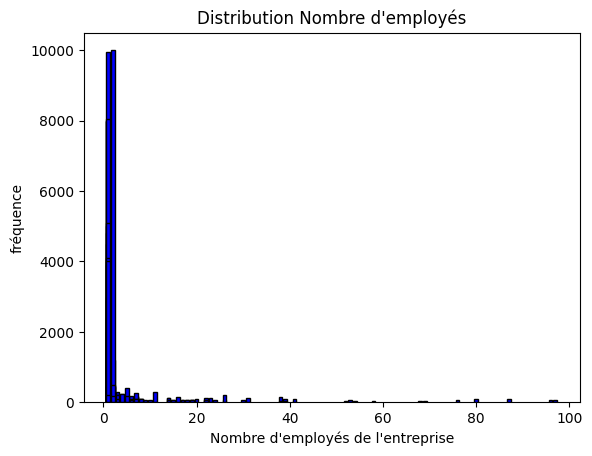

NoEmp
1       35986
2       29226
3       18999
4       14675
5       11645
        ...  
314         1
3900        1
280         1
4000        1
197         1
Name: count, Length: 225, dtype: int64


In [252]:
# Nombre d'employés de l'entreprise

value_counts3 = df['NoEmp'].value_counts()

value_counts3_filtre = value_counts3[value_counts3.values < 100]

value_counts3_filtre.sort_index()




plt.bar(value_counts3_filtre.values, value_counts3_filtre.index , color='blue', edgecolor = 'black')


plt.xlabel("Nombre d'employés de l'entreprise")
plt.ylabel('fréquence')
plt.title("Distribution Nombre d'employés")
# Augmente la visibilité des barres

plt.show()
df['NoEmp'].describe()

print(df['NoEmp'].value_counts())


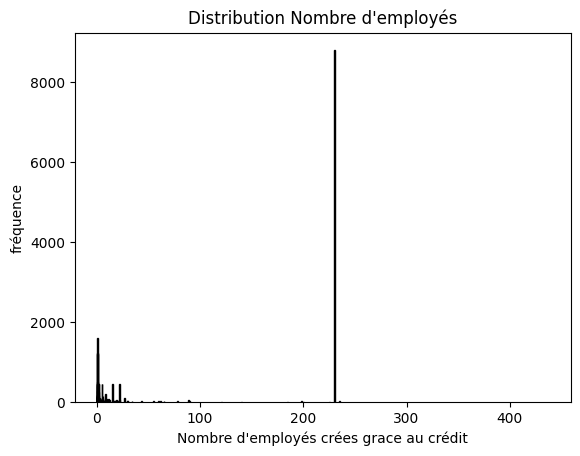

CreateJob
0       100650
1        19372
2        15869
3         6851
4         4260
         ...  
458          1
409          1
1618         1
57           1
73           1
Name: count, Length: 125, dtype: int64
